In [1]:
import json


import numpy as np
import pickle
from PIL import Image
from scipy.misc import imread, imresize
from collections import Counter
from sklearn.neighbors import NearestNeighbors
import time 
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os.path
import urllib.request
import shutil
from random import shuffle

from data.VGG16 import vgg16
from data.VGG16.imagenet_classes import class_names
import tensorflow as tf
 
from wordcloud import WordCloud
%matplotlib inline


# Import annotations

In [2]:

dii = json.load(open('data/dii/val.description-in-isolation.json', 'r'))

In [3]:
print(dii['type'])
print(dii['info'])

print("Fields:")
for key in dii.keys():
    print('', key, type(dii[key]))
    

albums = dii['albums'] 
annotations = dii['annotations'] 
images = dii['images'] 


print()
print(len(albums))
    
print("Album Fields:")
for subkey in albums[0].keys():
    print(' %s: %s' % (subkey,albums[0][subkey]))
    
print()
print(len(annotations))    
print("Annotation[0] Fields:")
for subkey in annotations[0][0].keys():
    print(' %s: %s' % (subkey,annotations[0][0][subkey]))
    
print()
print(len(images))
print("Image Fields:")
for subkey in images[7].keys():
    print(' %s: %s' % (subkey,images[0][subkey]))

description-in-isolation
SIND v1.0
Fields:
 albums <class 'list'>
 images <class 'list'>
 info <class 'str'>
 type <class 'str'>
 annotations <class 'list'>

998
Album Fields:
 id: 72157600601428727
 date_create: 1183374254
 photos: 15
 farm: 2
 secret: 0745b37a62
 title: Fourth of July 2007
 primary: 694227468
 server: 1125
 vist_label: 4th_of_july
 date_update: 1301274687
 owner: 67332546@N00
 description: Bubba burgers, beer and BBQ make for a great Fourth of July

14970
Annotation[0] Fields:
 text: six or seven bottle rockets next to a specialty firework .
 photo_order_in_story: 0
 album_id: 72157600601428727
 photo_flickr_id: 694227468
 original_text: Six or seven bottle rockets next to a specialty firework.
 worker_id: WFCAHLMWB3LKKAX
 tier: descriptions-in-isolation

21048
Image Fields:
 datetaken: 2007-07-02 03:54:30
 id: 694227468
 secret: 0745b37a62
 text: 
 latitude: 0
 url_o: https://farm2.staticflickr.com/1125/694227468_f6c433d7d8_o.jpg
 media: photo
 title: Fourth of July

In [4]:
im2texts = {}
for ann in annotations:
    ann = ann[0]
    im_id = ann["photo_flickr_id"]
    text  = ann["text"]
    
    if not im_id in im2texts:
        im2texts[im_id] = [text]
    else:
        im2texts[im_id].append(text)
#     if len(ann) != 1:
#         print(len(ann))

print(len(im2texts))
# for im_id in im2texts:
#     if len(im2texts[im_id]) != 1:
#         print(len(im2texts[im_id]))

# print(im2texts['392254079'])
# print(im2texts.keys())

4990


In [2]:
sis = json.load(open('data/sis/val.story-in-sequence.json', 'r'))

In [3]:

print(sis['type'])
print(sis['info'])

print("Fields:")
for key in sis.keys():
    print('', key, len(sis[key]), type(sis[key])) 
    
    
    
albums = sis['albums'] 
annotations = sis['annotations'] 
images = sis['images'] 


print()
print(len(albums))
    
print("Album Fields:")
for subkey in albums[0].keys():
    print(' %s: %s' % (subkey,albums[0][subkey]))
    
print()
print(len(annotations))    
print("Annotation[0] Fields:")
for subkey in annotations[0][0].keys():
    print(' %s: %s' % (subkey,annotations[0][0][subkey]))
    
    
    
print()
print(len(images))
print("Image Fields:")
for subkey in images[7].keys():
    print(' %s: %s' % (subkey,images[0][subkey]))

    
    

story-in-sequence
SIND v1.0
Fields:
 type 17 <class 'str'>
 info 9 <class 'str'>
 albums 998 <class 'list'>
 images 21048 <class 'list'>
 annotations 24950 <class 'list'>

998
Album Fields:
 id: 72157600601428727
 date_update: 1301274687
 description: Bubba burgers, beer and BBQ make for a great Fourth of July
 title: Fourth of July 2007
 farm: 2
 vist_label: 4th_of_july
 photos: 15
 secret: 0745b37a62
 primary: 694227468
 server: 1125
 date_create: 1183374254
 owner: 67332546@N00

24950
Annotation[0] Fields:
 setting: first-2-pick-and-tell
 storylet_id: 202350
 worker_id: AS2MDFCRUS236TU
 worker_arranged_photo_order: 0
 album_id: 72157600601428727
 text: my sister arrived early to help me with the family bar bq .
 original_text: My sister arrived early to help me with the family Bar BQ.
 tier: story-in-sequence
 photo_flickr_id: 693397887
 story_id: 40470

21048
Image Fields:
 text: 
 album_id: 72157600601428727
 id: 694227468
 longitude: 0
 latitude: 0
 title: Fourth of July prerequi

# Create maps/dictionaries

### topic2albums - album2topic

In [4]:
topic2albums = {}
album2topic = {}

for (i, album) in enumerate(albums):
    album_id = album['id']
    vist_label = album["vist_label"]
    
    album2topic[album_id] = vist_label
    
    if not vist_label in topic2albums: 
        topic2albums[vist_label] = [album_id]
    else: 
        topic2albums[vist_label].append(album_id)
    

print("Topics(%d)"%len(topic2albums))
for i,key in enumerate(topic2albums.keys()):         
    print("%d.%s (%d)"%(i,key, len(topic2albums[key])))
 

Topics(26)
0.birthday (87)
1.baby_shower (5)
2.building_a_house (98)
3.MISC (60)
4.easter (50)
5.fair (14)
6.bat_mitzvah (2)
7.church (47)
8.camping (1)
9.day_parade (23)
10.bar_mitzvah (8)
11.eid_al-fitr (3)
12.breaking_up (77)
13.christmas (20)
14.cinco_de_mayo (20)
15.4th_of_july (44)
16.bike_race (29)
17.amusement_park (103)
18.cooking_dinner (19)
19.birthday_party (20)
20.carnival (57)
21.beach (150)
22.eid_al-adha (2)
23.car_accident (26)
24.engagement (17)
25.award_ceremony (16)


### album2stories

In [6]:
album2stories = {}
for album in albums:
    album2stories[album["id"]] = set();

for ann in annotations:
    ann = ann[0]
    story_id = ann["story_id"]
    album_id = ann["album_id"]
    
    album2stories[album_id].add(story_id)
    
    
for album_id in album2stories.keys():
    album2stories[album_id] = list(album2stories[album_id])
    

In [7]:
# for key in topic2albums.keys():         
#     print(key)
#     print(topic2albums[key])
#     print()

### topic2stories

In [8]:
topic2stories = {}

for topic in topic2albums:
    topic2stories[topic] = []
    
    topic_albums = topic2albums[topic];
    for album_id in topic_albums:
        stories = album2stories[album_id]
        topic2stories[topic].extend(stories)
        
print("Topics(#stories)")
for i,key in enumerate(sorted(topic2stories.keys())):         
    print("%d.%s (%d)"%(i,key, len(topic2stories[key])))

Topics(#stories)
0.4th_of_july (220)
1.MISC (300)
2.amusement_park (515)
3.award_ceremony (80)
4.baby_shower (25)
5.bar_mitzvah (40)
6.bat_mitzvah (10)
7.beach (750)
8.bike_race (145)
9.birthday (435)
10.birthday_party (100)
11.breaking_up (385)
12.building_a_house (490)
13.camping (5)
14.car_accident (130)
15.carnival (285)
16.christmas (100)
17.church (235)
18.cinco_de_mayo (100)
19.cooking_dinner (95)
20.day_parade (115)
21.easter (250)
22.eid_al-adha (10)
23.eid_al-fitr (15)
24.engagement (85)
25.fair (70)


In [11]:
# print(topic2stories['birthday'])
# import pickle
# with open("topic2stories", 'wb') as output:
#         pickle.dump(topic2stories, output)


### stories2annotations

In [12]:

stories2annotations = {}
with open("stories2annotations", 'rb') as file:
        stories2annotations = pickle.load(file)
        

In [13]:
anns = stories2annotations[topic2stories["beach"][0]]
for ann in anns:
    ann = annotations[ann][0]
#     print(ann)
#     photo_id = ann["photo_id"]
    print(ann['text'])
# print()

this morning [male] and i went for a walk on the beach .
the weather was great and made for a beautiful start to the day .
[male] insisted on getting his toes wet , as usual .
it is so peaceful watching the waves come in and the sun come up .
what a great way to start the morning , at the beach with my [male] .


## HTML GENERATION

In [14]:
 
with open("image2dii", 'rb') as file:
        image2dii = pickle.load(file)
        
print(len(image2dii))


print(list(image2dii.keys())[0])
print(image2dii['392254079'])


21048
4444211972
['', 'barcelona españa museum trenes spain trains catalunya museo espagne hdr garraf locomotives electrics ferrocarril espanya locomotoras vilanovailageltrú tonemapping eléctricas singleraw artizen lock06']


In [15]:


num_of_stories = 2
shuffle_stories = True

    
content = ""    

content +="Topics(#stories): <ol>"
for i,key in enumerate(topic2stories.keys()):         
    content += '<li> <a href="#%s"> %s (%d) </a> </li>'%(key,key, len(topic2stories[key]))

content +="</ol>"
td_width = 50

c = 0
for topic in topic2stories:
    if c > 5:
        pass #break
    c += 1   
    if shuffle_stories:
        shuffle(topic2stories[topic])
        
    stories = topic2stories[topic][:num_of_stories]
    
    #topic
    content += '<h2  id="%s">%s</h2>\n' % (topic,topic) 
    
    
    print ('Topic : ', topic)
    for story in stories:
        
        #story id
        content += '<h3> Story id: %s </h3>\n' % story
        
        content += '<table cellspacing="15"><tbody>'

        tr = '<tr>'
        #image 
        for image in stories2annotations[story]:
            image_id = sis['annotations'][image][0]['photo_flickr_id']
            filename = "data/val.images/" + image_id + ".jpg"
            td = '<td  width="%d"><img src="%s" align="middle"  /></td>'%(td_width,filename)
            tr += td
        content += tr + "\n"
        
        tr = "<tr>"
        #sis text
        for image in stories2annotations[story]:
            image_sis = sis['annotations'][image][0]['text']
            td = '<td  width="%d"><b>SIS: </b> %s</td>' %(td_width, image_sis)
            tr += td
        content += tr + "\n"
        
        tr = "<tr>"
        #dii text
        for image in stories2annotations[story]:
            image_id = sis['annotations'][image][0]['photo_flickr_id']
            image_dii = image2dii[image_id][0]
            td = '<td  width="%d"><b>DII: </b> %s </td>' % (td_width, image_dii)
            tr += td
        content += tr + "\n"
        
        tr = "<tr>"
        #tags
        for image in stories2annotations[story]:
            image_id = sis['annotations'][image][0]['photo_flickr_id']
            
            image_tags = image2dii[image_id][1]
            td = '<td  width="%d"><b>Tags: </b> %s</td>' % (td_width,image_tags.replace(" ", ", "))
            tr += td
        content += tr + "\n"
        
    
        content += "</tbody></table>\n"
    
# print(content)

Topic :  camping
Topic :  cinco_de_mayo
Topic :  4th_of_july
Topic :  MISC
Topic :  carnival
Topic :  church
Topic :  fair
Topic :  eid_al-adha
Topic :  birthday
Topic :  beach
Topic :  building_a_house
Topic :  cooking_dinner
Topic :  christmas
Topic :  birthday_party
Topic :  eid_al-fitr
Topic :  day_parade
Topic :  car_accident
Topic :  bar_mitzvah
Topic :  bat_mitzvah
Topic :  amusement_park
Topic :  easter
Topic :  bike_race
Topic :  baby_shower
Topic :  breaking_up
Topic :  engagement
Topic :  award_ceremony


In [16]:

with open('prefix.txt', 'rb') as prefix_file:
    prefix = prefix_file.read()
    
with open('postfix.txt', 'rb') as postfix_file:
    postfix = postfix_file.read()    

html_content =  prefix + content.encode("utf-8") + postfix

In [17]:
with open('stories.html', 'wb') as html_file:
    html_file.write(html_content)

In [18]:
print(stories2annotations["43142"])
print(annotations[13010][0])

[13010, 13011, 13012, 13013, 13014]
{'worker_arranged_photo_order': 0, 'text': 'here is a photo of my brothers and i when we were kids .', 'album_id': '190837', 'photo_flickr_id': '7646196', 'original_text': 'Here is a photo of my brothers and I when we were kids.', 'storylet_id': '215710', 'worker_id': '6O5J6YWQ6NH16BV', 'setting': 'last-3-pick-old-and-tell', 'story_id': '43142', 'tier': 'story-in-sequence'}


### download and show an image

In [ ]:


pos = 1554;
url = images[pos]['url_o']
id = images[pos]['id']
    
filename =  id + ".jpg"

if not os.path.isfile("data/images/" + filename):
    urllib.request.urlretrieve(url, "data/images/" + filename)
im = mpimg.imread("data/images/" + filename)

plt.xticks([]," ")
plt.yticks([]," ")
plt.imshow(im)
plt.show()



# VGG16

In [19]:
sess = tf.Session()
imgs = tf.placeholder(tf.float32, [None, 224, 224, 3])
vgg = vgg16.vgg16(imgs, 'data/VGG16/vgg16_weights.npz', sess)

0 conv1_1_W (3, 3, 3, 64)
1 conv1_1_b (64,)
2 conv1_2_W (3, 3, 64, 64)
3 conv1_2_b (64,)
4 conv2_1_W (3, 3, 64, 128)
5 conv2_1_b (128,)
6 conv2_2_W (3, 3, 128, 128)
7 conv2_2_b (128,)
8 conv3_1_W (3, 3, 128, 256)
9 conv3_1_b (256,)
10 conv3_2_W (3, 3, 256, 256)
11 conv3_2_b (256,)
12 conv3_3_W (3, 3, 256, 256)
13 conv3_3_b (256,)
14 conv4_1_W (3, 3, 256, 512)
15 conv4_1_b (512,)
16 conv4_2_W (3, 3, 512, 512)
17 conv4_2_b (512,)
18 conv4_3_W (3, 3, 512, 512)
19 conv4_3_b (512,)
20 conv5_1_W (3, 3, 512, 512)
21 conv5_1_b (512,)
22 conv5_2_W (3, 3, 512, 512)
23 conv5_2_b (512,)
24 conv5_3_W (3, 3, 512, 512)
25 conv5_3_b (512,)
26 fc6_W (25088, 4096)
27 fc6_b (4096,)
28 fc7_W (4096, 4096)
29 fc7_b (4096,)
30 fc8_W (4096, 1000)
31 fc8_b (1000,)


Probs:
  weasel 0.693386
  polecat, fitch, foulmart, foumart, Mustela putorius 0.175388
  mink 0.122086
  black-footed ferret, ferret, Mustela nigripes 0.00887066
  otter 0.000121083


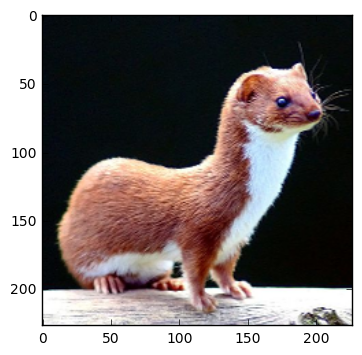

In [20]:
img1 = imread('data/VGG16/laska.png', mode='RGB')
plt.imshow(img1)
img1 = imresize(img1, (224, 224))



prob = sess.run(vgg.probs, feed_dict={vgg.imgs: [img1]})[0]
preds = (np.argsort(prob)[::-1])[0:5]
print("Probs:")
for p in preds:
    print(" ",class_names[p], prob[p])
# print(prob) 

Probs:
  weasel 0.693386
  polecat, fitch, foulmart, foumart, Mustela putorius 0.175388
  mink 0.122086
  black-footed ferret, ferret, Mustela nigripes 0.00887066
  otter 0.000121083
  mongoose 0.000117807
  fox squirrel, eastern fox squirrel, Sciurus niger 2.44611e-05
  badger 1.50295e-06
  marmot 1.21616e-06
  hamster 5.10899e-07


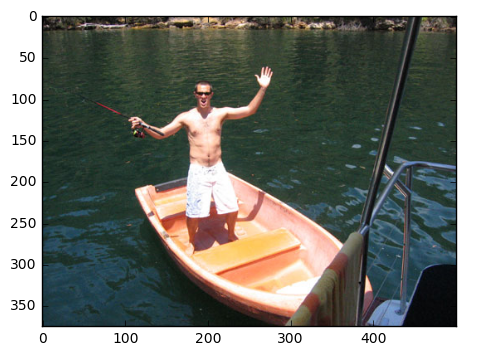

In [23]:
img2 = imread('data/val.images/1751489.jpg', mode='RGB')
plt.imshow(img2)

img2 = imresize(img2, (224, 224))
prob = sess.run(vgg.probs, feed_dict={vgg.imgs: [img1]})[0]
preds = (np.argsort(prob)[::-1])[0:10]
print("Probs:")
for p in preds:
    print(" ",class_names[p], prob[p])
# print(prob) 


In [298]:
# top_k = 10;

# start = time.time()

# img2probs = {}

# for im_id in img2features.keys():
#     features = img2features[im_id]
#     prob = sess.run(vgg.probs, feed_dict={vgg.fc2: [features]})[0]
    
#     img2probs[im_id] = prob

# print(time.time() - start)

1751489.jpg
Probs:
  canoe 0.586768
  gondola 0.347251
  paddle, boat paddle 0.0575605
  lakeside, lakeshore 0.00171236
  lifeboat 0.00114182


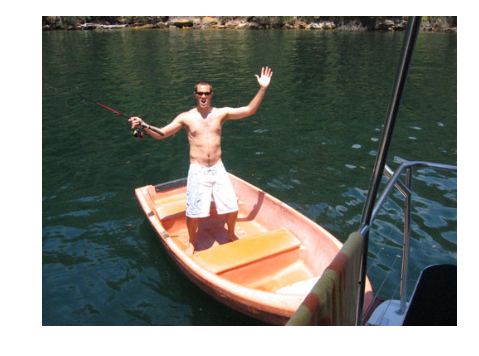

In [27]:
random_im = "1751489.jpg"#random_im = list(img2probs.keys())[np.random.randint(len(img2probs))]
print(random_im)
img = imread("data/val.images/" + random_im)
plt.imshow(img)
plt.axis("off")

top_k = 5


prob = img2probs[random_im]
preds = (np.argsort(prob)[::-1])[0:top_k]

print("Probs:")
for p in preds:
    print(" ",class_names[p], prob[p]) 
# print(prob)


In [ ]:
a = [[]] * 5
a

## Knn search

In [25]:
with open("img2probs", 'rb') as file:
        img2probs = pickle.load(file)

In [ ]:
with open("img2features", 'rb') as file:
        img2features = pickle.load(file)

print(len(img2features)) 
print(len(list(img2features.values())[0]))

In [ ]:
image_features = []

im_ids = []

for im_id in img2features:
    image_features.append(img2features[im_id])
    im_ids.append(im_id)


X = np.array(image_features)
nbrs = NearestNeighbors(n_neighbors=100, algorithm='ball_tree').fit(X)

In [ ]:
test_im_pos = 152
distances, indices = nbrs.kneighbors(X[test_im_pos,:].reshape(1,-1))

my_path ='data/val.images/'

for index in indices[0][:5]:
    filename = im_ids[index]
    img = imread(my_path + filename, mode='RGB')

    plt.imshow(img)
    plt.axis('off')
    plt.title(filename)
    plt.show()


## Histogram stuff

In [29]:
from nltk.corpus import wordnet as wn
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import string

# from pytagcloud import create_tag_image, make_tags
# from pytagcloud.lang.counter import get_tag_counts 

In [30]:


nouns = {x.name().split('.', 1)[0] for x in wn.all_synsets('n')}
verbs = {x.name().split('.', 1)[0] for x in wn.all_synsets('v')}
stopwords = set(stopwords.words('english'))



def get_tokens(text, stopwords, nouns = [], verbs = [], remove_only_stopwords = True):
    

    translator = str.maketrans('', '', string.punctuation)
    text = text.translate(translator)
    
    wordnet_lemmatizer = WordNetLemmatizer()
    
    if remove_only_stopwords == False and len(nouns) == 0:
        raise ValueError("You want to keep only nouns and verbs, but you don't give them as input")
    
    text = text.split()
    tokens = []
    
    for word in text.copy():
        
        if word == '[male]' or word == '[female]':
            tokens.append(word)
            continue
        
        if word not in stopwords:
            
            if  wordnet_lemmatizer.lemmatize(word) in nouns:
                
                word = wordnet_lemmatizer.lemmatize(word)
                

            elif wordnet_lemmatizer.lemmatize(word, 'v') in verbs:
                    
                word = wordnet_lemmatizer.lemmatize(word, 'v')
           
        
            if remove_only_stopwords == False:
                
                if word in nouns or word in verbs:
                    
                    tokens.append(word)
                    
            else:
                    tokens.append(wordnet_lemmatizer.lemmatize(word))
                
                
    return tokens
    
    

# tokens = get_tokens(i, stopwords, nouns, verbs, remove_only_stopwords = False)

In [138]:
def get_entropy(probs):
    k = len(probs)
    return - sum([p*np.log(p) for p in probs[:k]])


def plot_histograms(topic_histograms):

    for topic in valid_topics[:]:
        histograms = topic_histograms[topic] 

        fig, axarr = plt.subplots(2, 5,figsize=(20,6))

        st = fig.suptitle(topic, fontsize = 30)

    #     st.set_y(1.1)
    #     fig.subplots_adjust(top=0.8)

        for order in range(5):
            hist = histograms[order].items()
            hist = list(hist)

            #keep 30 most frequent
            freqs = [item[1] for item in hist]
            freqs.sort(reverse=True)
            hist = [item for item in hist if item[1] > freqs[30]] 

            text = ""
            for token in hist:
                 for i in range(token[1]):
                    text += token[0] + " "

            #normalized frequencies by max
            wordcloud = WordCloud(collocations = False, relative_scaling = 0.7, stopwords = [], background_color = "white").generate(text)

            axarr[0,order].imshow(wordcloud, interpolation='bilinear')
            axarr[0,order].axis('off')
            axarr[0,order].set_title('%d' %order, fontsize = 15)


            freqs = [item[1] for item in hist]
            norm = sum(freqs)
            probs = [x/norm for x in freqs]

            entropy = get_entropy(probs)

            axarr[1,order].bar(range(len(hist)), [item[1] for item in hist], align='center')

            axarr[1,order].set_xticks(range(1,1+len(hist)))
            axarr[1,order].set_xticklabels([item[0] for item in hist], rotation = 90, size = 7)

            axarr[1,order].set_title("entropy = %f"%entropy,fontsize = 15)

        _ = plt.show()

    


In [126]:


valid_topics = [topic for topic in topic2stories.keys() if len(topic2stories[topic]) > 50]
valid_topics.remove("MISC")
print("Valid Topics (%d)" % len(valid_topics))


topic_histograms = {}

for topic in valid_topics:
    print(topic)
    
    words_per_storylet = [[], [], [], [], []] 
    
    for story in topic2stories[topic]:
        
        for order, ann in enumerate(stories2annotations[story]):
            
            text = sis["annotations"][ann][0]["text"]
            tokens = get_tokens(text, stopwords, nouns, verbs)
            words_per_storylet[order].extend(tokens)
            
    
    histograms = []
    for order in range(5):
        cnt = Counter(words_per_storylet[order])
        histograms.append(cnt)

    topic_histograms[topic] = histograms    
        
        
        
    

Valid Topics (19)
cinco_de_mayo
4th_of_july
carnival
church
fair
birthday
beach
building_a_house
cooking_dinner
christmas
birthday_party
day_parade
car_accident
amusement_park
easter
bike_race
breaking_up
engagement
award_ceremony


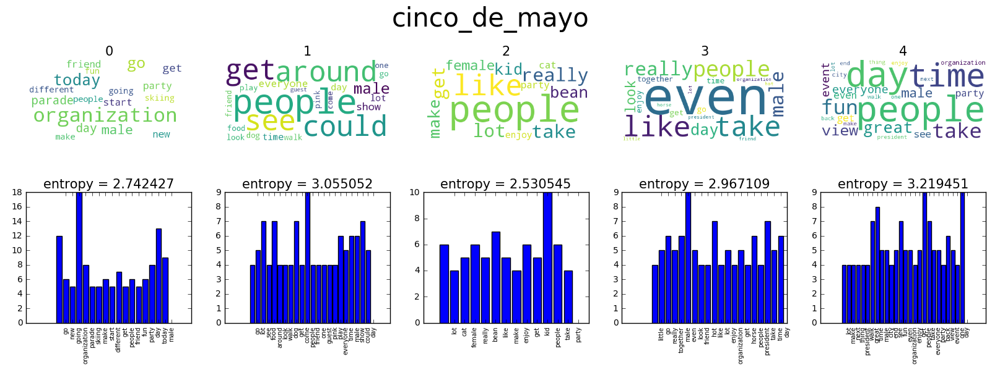

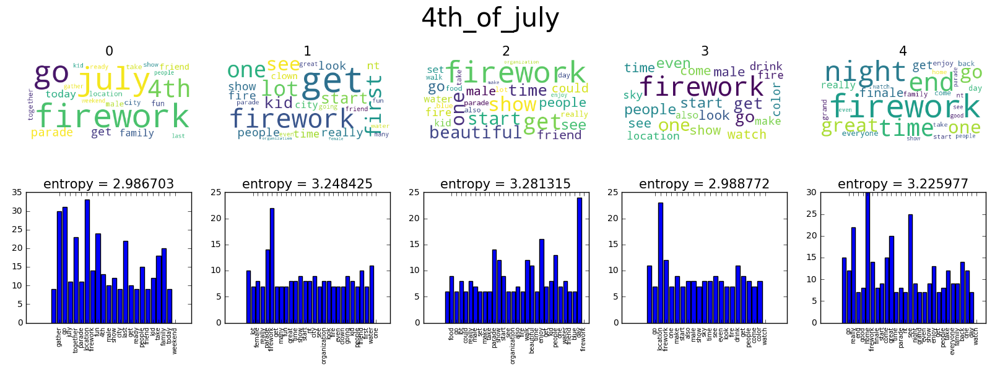

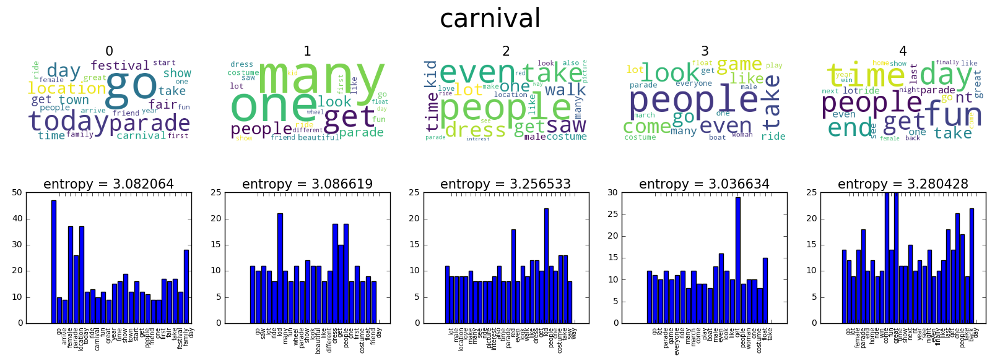

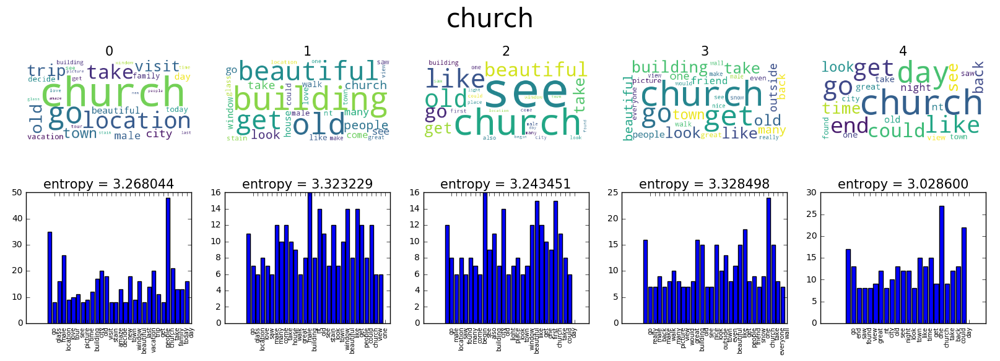

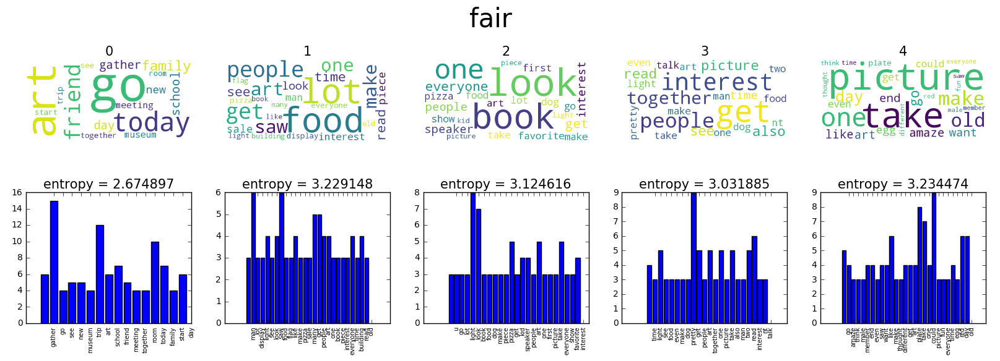

...

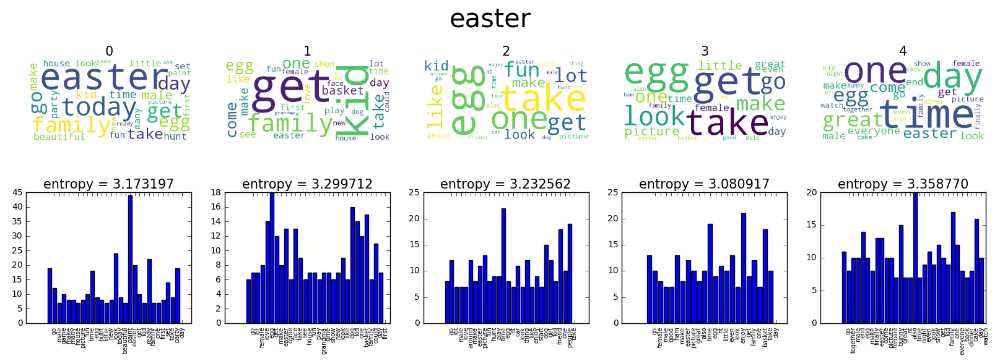

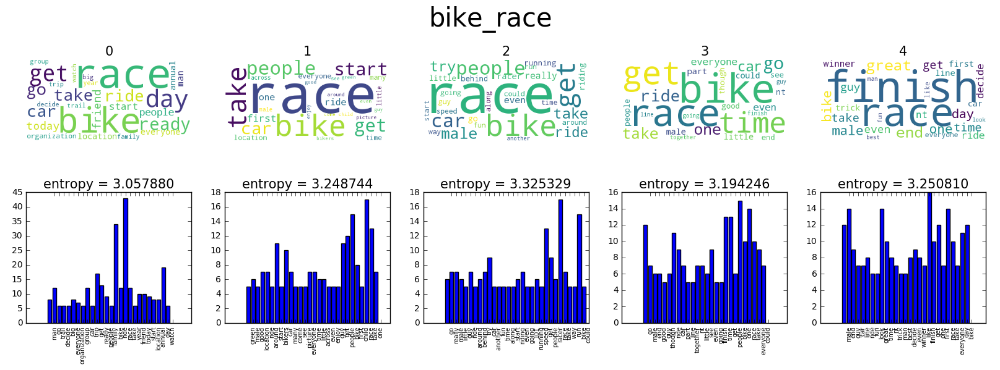

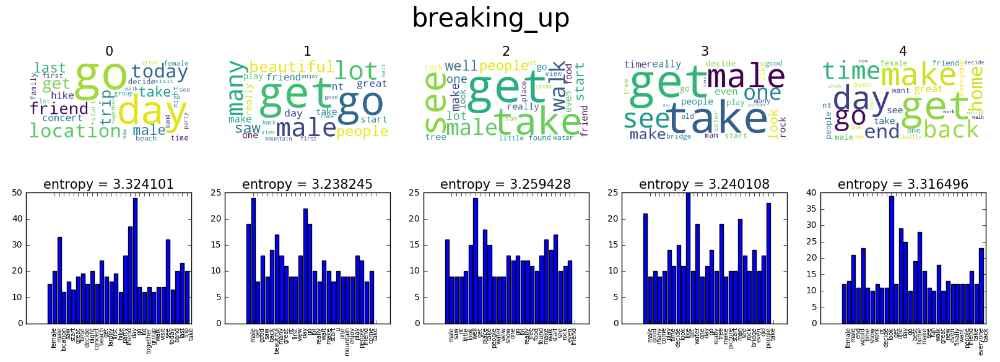

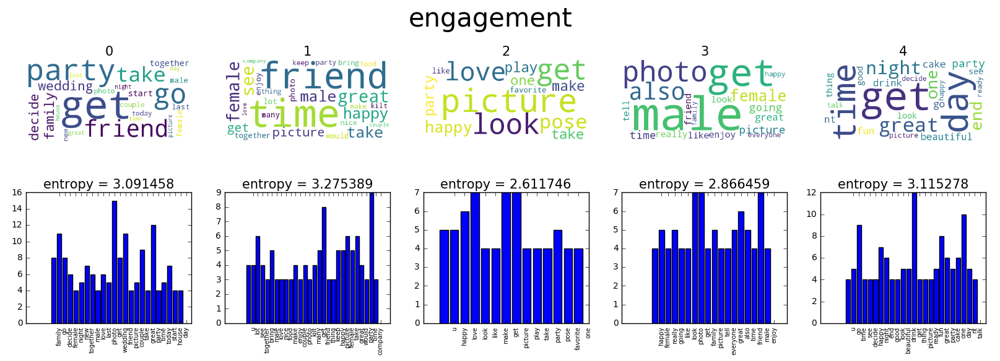

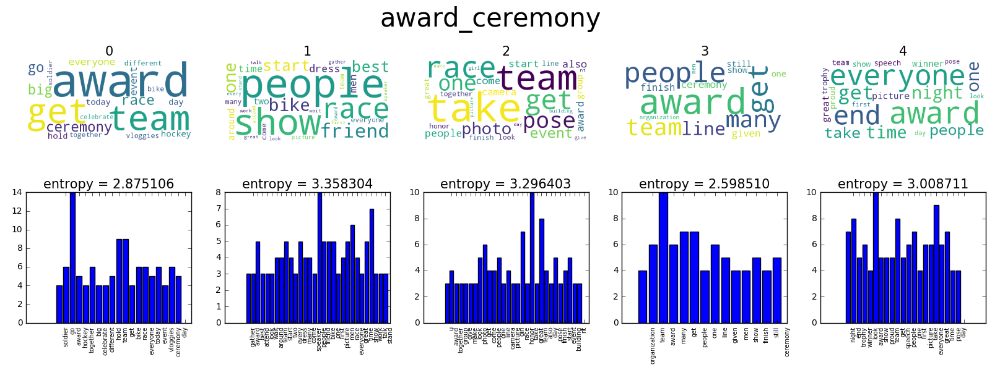

In [139]:


plot_histograms(topic_histograms)


In [140]:
def get_most_probable_words(prob, top_k):
    preds = (np.argsort(prob)[::-1])[0:top_k]
    predictions = list()
    for p in preds:
        # keep first word e.g. paddle, boat paddle keeps only paddle
        pred = class_names[p].split(',', 1)[0]
        predictions.append(pred)
    return predictions


topic_histograms = {}

for topic in valid_topics:
    print(topic)
    
    words_per_storylet = [[], [], [], [], []] 
    
    for story in topic2stories[topic]:
        
        for order, ann in enumerate(stories2annotations[story]):
            
            img_id = sis["annotations"][ann][0]["photo_flickr_id"] + ".jpg"
            probs = img2probs[img_id]
            tokens = get_most_probable_words(probs, 3)
            words_per_storylet[order].extend(tokens)
            
    
    histograms = []
    for order in range(5):
        cnt = Counter(words_per_storylet[order])
        histograms.append(cnt)

    topic_histograms[topic] = histograms    
        

cinco_de_mayo
4th_of_july
carnival
church
fair
birthday
beach
building_a_house
cooking_dinner
christmas
birthday_party
day_parade
car_accident
amusement_park
easter
bike_race
breaking_up
engagement
award_ceremony


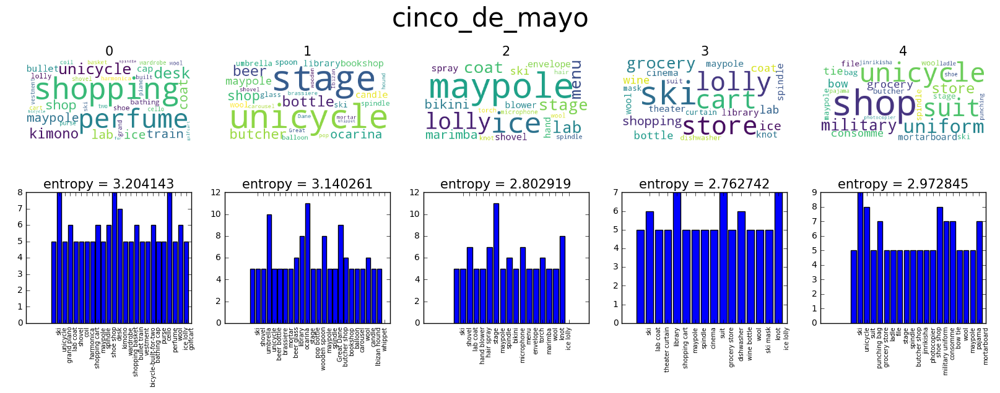

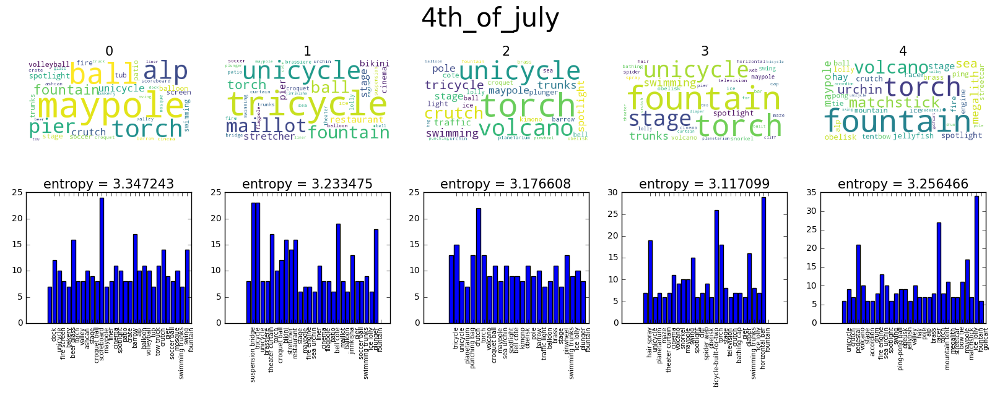

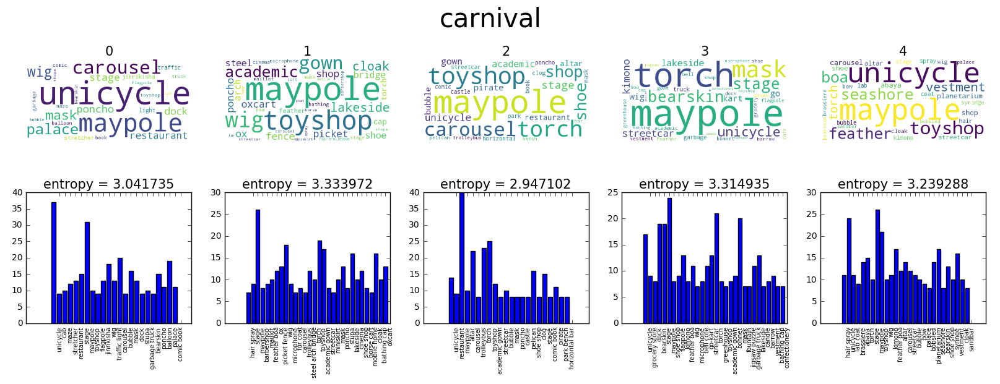

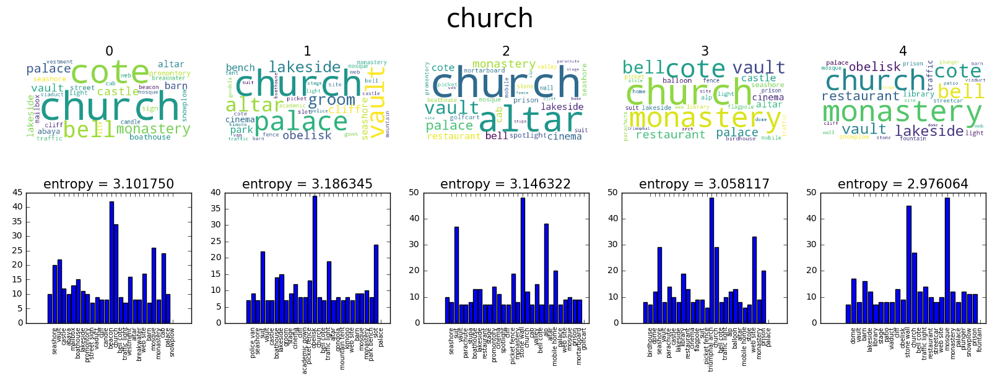

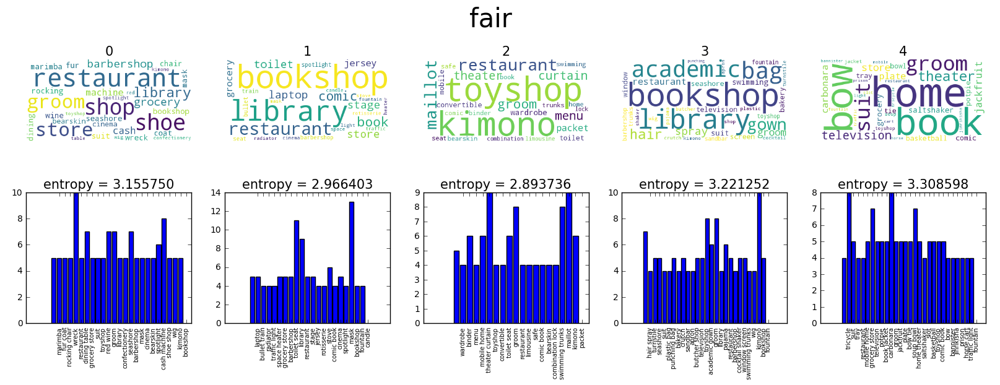

...

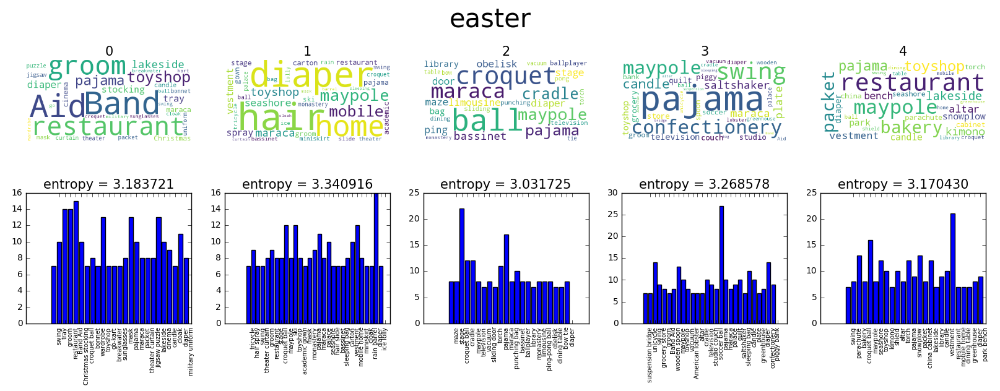

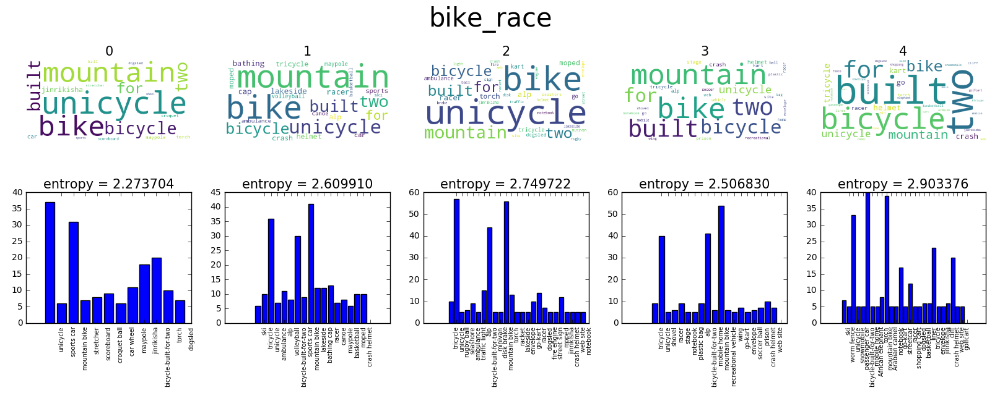

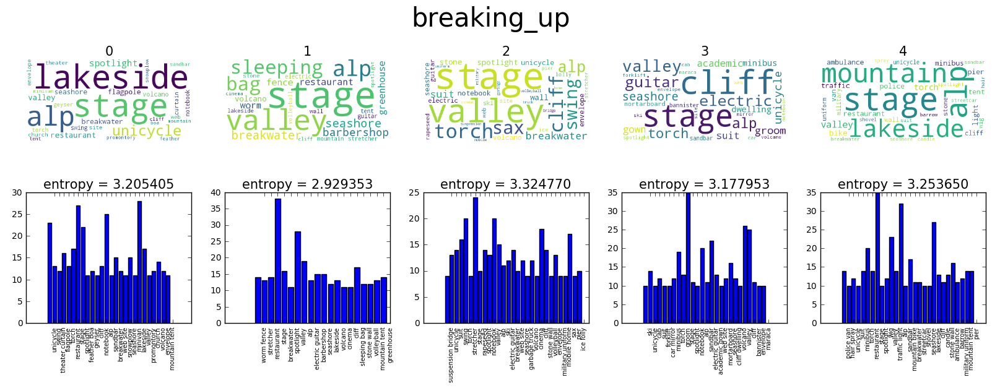

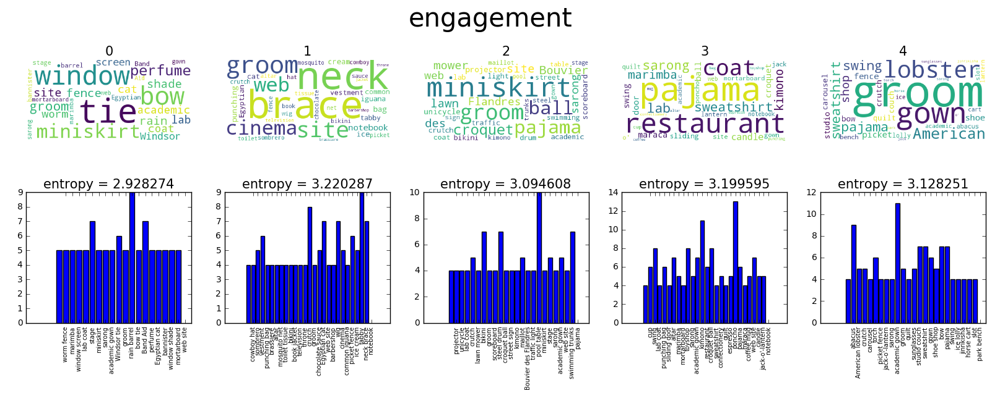

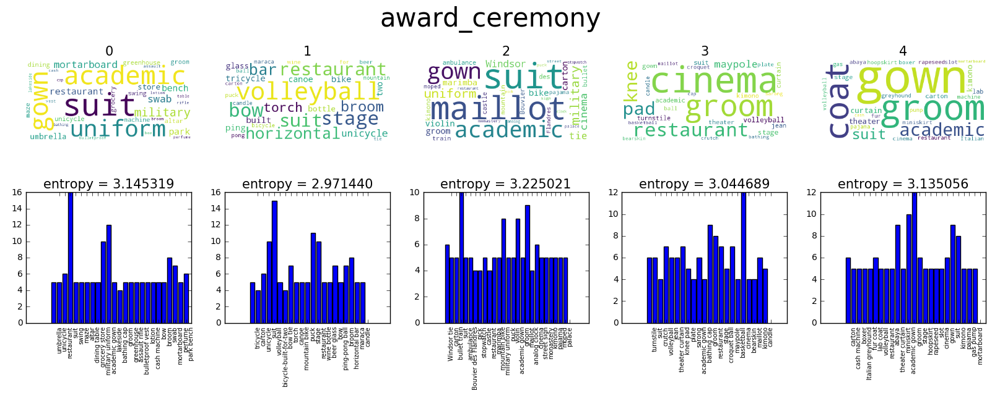

In [141]:
plot_histograms(topic_histograms)

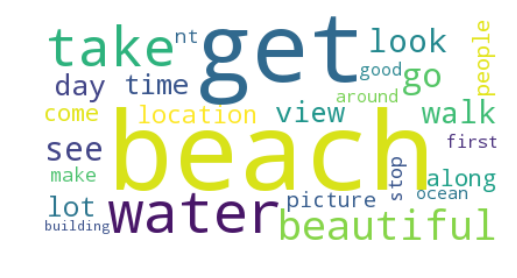

In [36]:
text = ""
for token in hist:
     for i in range(token[1]):
        text += token[0] + " "
        
#normalized frequencies by max
wordcloud = WordCloud(collocations = False, relative_scaling = 0.7, stopwords = [], background_color = "white").generate(text)
words = wordcloud.words_

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()